# Blend Mode Compendium

This notebook uses simple numpy operations to calculate common blend modes and demonstrates a comparison between the resulting Python images and the corresponding results from Adobe Photoshop.

### Objectives:
- Implement common blend modes (e.g., multiply, screen, overlay, hue) in Python.
- Compare the visual outcomes of the Python implementation with those from Photoshop.

### Approach:
- **Python Implementation:** Each blend mode is coded from scratch using mainly numpy operations.
- **Photoshop Reference:** Images processed using Photoshop are imported for side-by-side visual comparison.

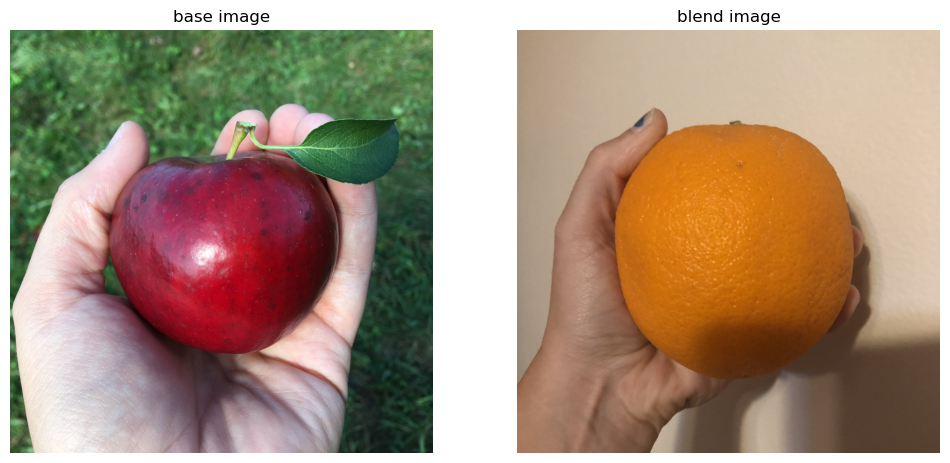

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from functions.blend_mode_functions import blend_images
from functions.image_functions import generate_striped_images, load_and_crop_to_square
from functions.calculations import calculate_absolute_error
import matplotlib.image as mpimg
from functions.image_functions import plot_2_images, create_alpha_transition_graphic, generate_rainbow_colors, generate_striped_images, load_and_crop_to_square
epsilon = 1e-10
test_dir = 'test images' # Folder where test images are stored
image_folder = "photoshop images 2"  # Folder where photoshop images are stored

def test_blend_mode(blend_mode, blend_mode_function):   
    # Generate blended image using the provided blend mode function
    lb = blend_mode_function(image1, image2)
    
    # Load the Photoshop reference image
    imagetest = mpimg.imread(os.path.join(image_folder,'test_'+blend_mode+'.png'))

    # Plot the test images side by side
    fig, axs = plot_2_images(lb, imagetest, 'generated', 'photoshop', False)
    
    # Add a super title with the blend mode
    plt.suptitle(f'Blend Mode: {blend_mode.replace("_", " ").title()}', fontsize=16) 
    
    # Show the plot
    plt.show()
    
# Load Images
image1 = mpimg.imread(os.path.join(test_dir,'imageAcropped.png'))
image2 = mpimg.imread(os.path.join(test_dir,'imageBcropped.png'))
fig, axs = plot_2_images(image1, image2, 'base image', 'blend image')

### Normal 
Displays the top image over the base image

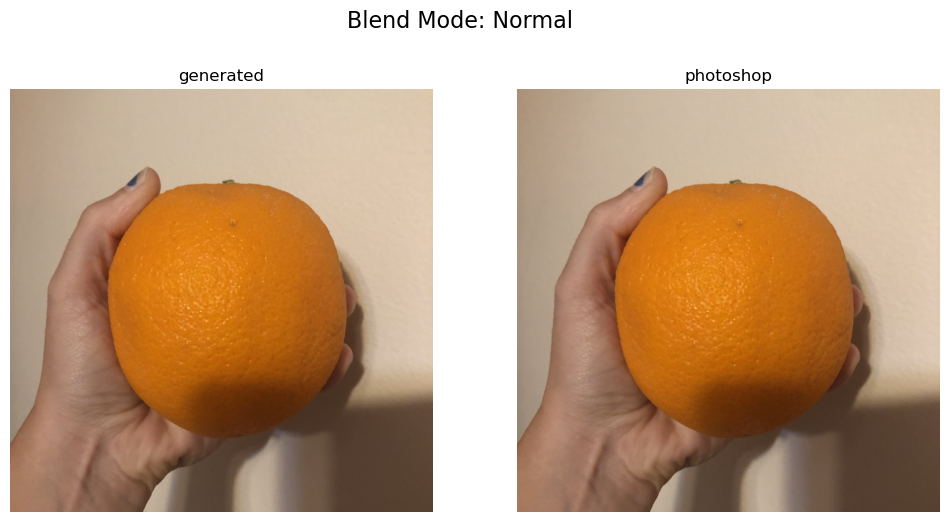

In [2]:
def normal(image1, image2):
    return image2

test_blend_mode('normal', normal)

### Darken
Compares the pixel values of both images and retains the darker value at each position and color channel

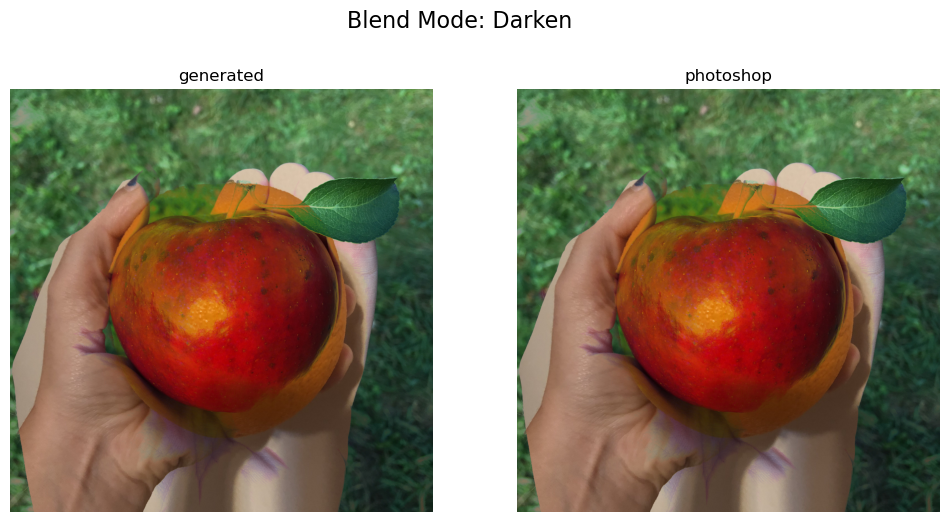

In [3]:
def darken(image1, image2):
    return np.minimum(image1, image2)

test_blend_mode('darken', darken)

### Multiply
Multiplies the pixel values of the base image by the corresponding pixel values of the blend image

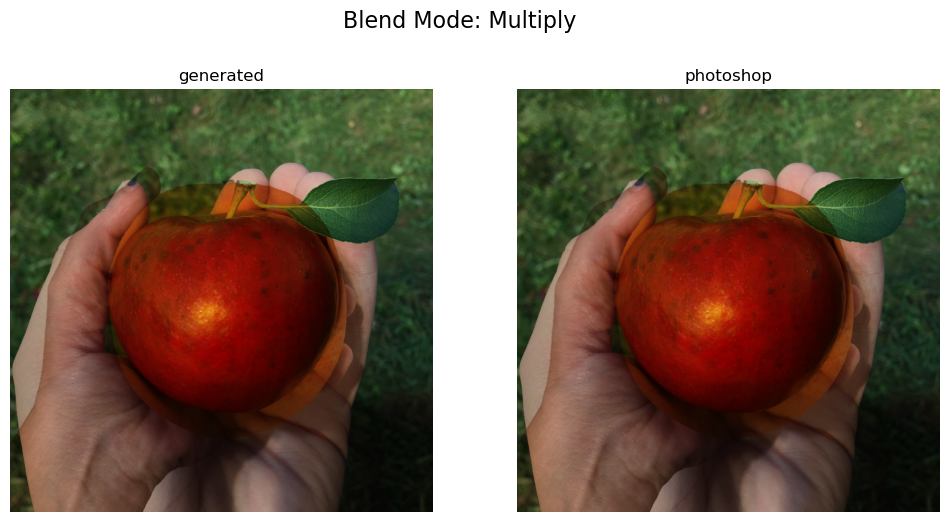

In [4]:
def multiply(image1, image2):
    return image1 * image2

test_blend_mode('multiply', multiply)

### Color Burn
Looks at the color information in each channel and darkens the base color to reflect the blend color by increasing the contrast between the two. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

#### Formula:

$
\text{Color Burn}(\textit{A}, \textit{B}) = 1 - \frac{1 - \textit{A}}{\textit{B}}
$

Where:
- **A** is the base image.
- **B** is the blend image.

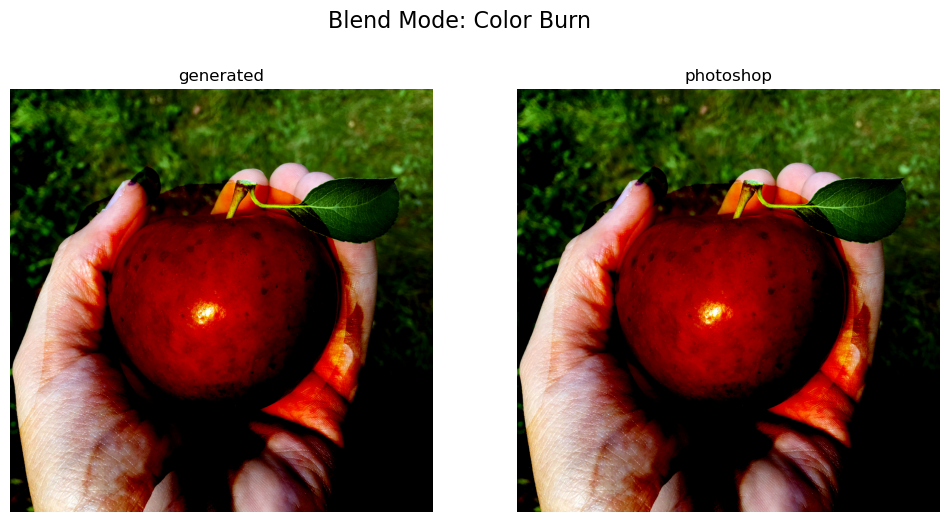

In [5]:
def color_burn(image1, image2):
    return 1 - np.minimum(1, (1 - image1) / np.clip(image2, epsilon, 1))

test_blend_mode('color_burn', color_burn)

### Linear burn
Decreases the brightness of the base color based on the value of the blend color [[source](https://photoshoptrainingchannel.com/blending-modes-explained/#commuted-blending-modes)]

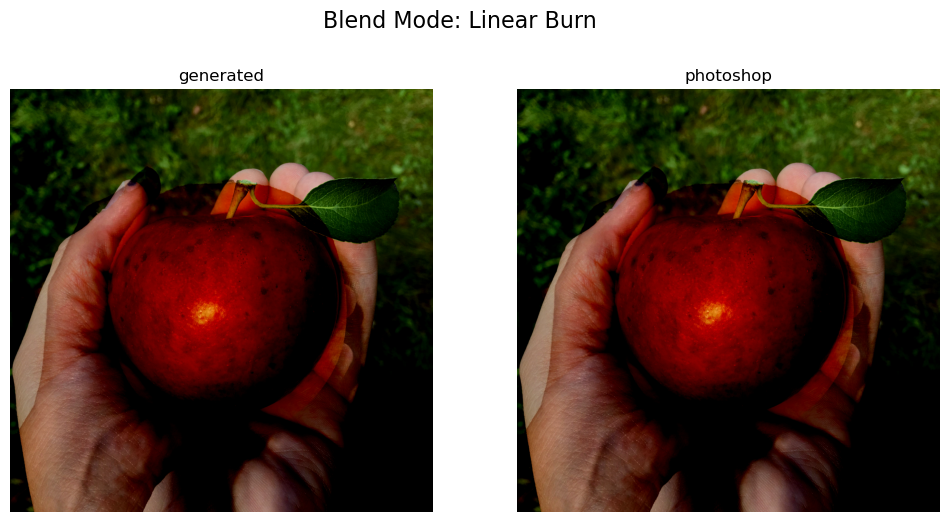

In [6]:
def linear_burn(image1, image2):
    return np.maximum(0, image1 + image2 - 1)   

test_blend_mode('linear_burn', linear_burn)

### Darker Color
Uses apparent brightness to compare base and blend images and choose the darker color between the two at each pixel location

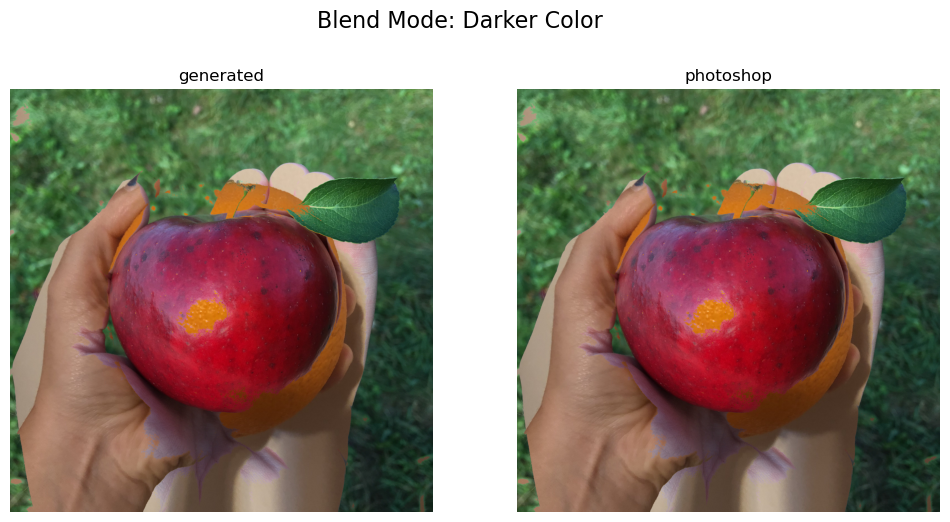

In [7]:
def calculate_color_brightness(image):
    #https://www.w3.org/TR/AERT/#color-contrast
    return 0.299 * image[:, :, 0] + 0.587 * image[:, :, 1] + 0.114 * image[:, :, 2]
    
def darker_color(image1, image2):
    # Apply the color brightness formula
    brightness_image1 = calculate_color_brightness(image1)
    brightness_image2 = calculate_color_brightness(image2)
    
    # Find the minimum sum between the two images
    min_sum = np.minimum(brightness_image1, brightness_image2)
    
    # Use np.where to select colors based on the minimum sum
    mask = (brightness_image1 == min_sum)
    return np.where(mask[:, :, None], image1, image2)

test_blend_mode('darker_color', darker_color)

### Lighten
Compares the pixel values of both images and retains the lighter value at each position and color channel

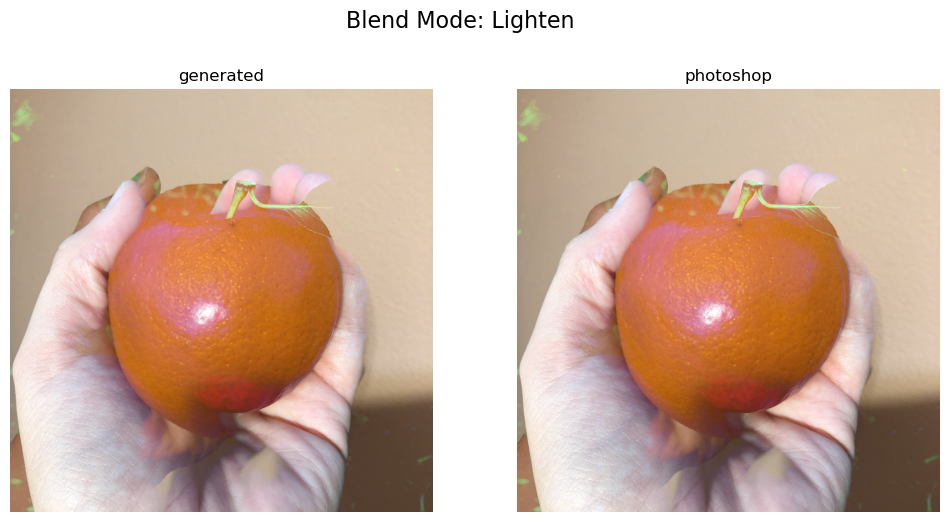

In [8]:
def lighten(image1, image2):
    return np.maximum(image1, image2)   

test_blend_mode('lighten', lighten)

### Screen
Looks at each channel’s color information and multiplies the inverse of the blend and base colors. The result color is always a lighter color. Screening with black leaves the color unchanged. Screening with white produces white. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

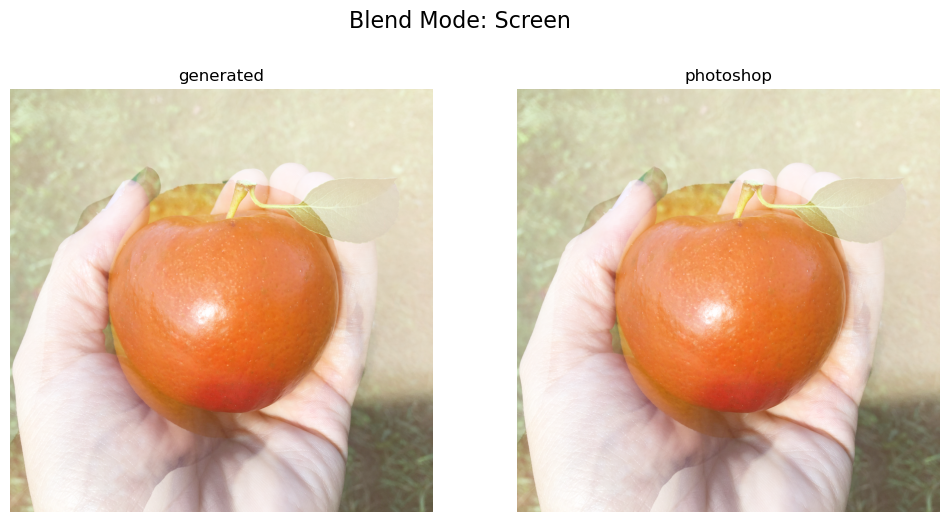

In [9]:
def screen(image1, image2):
    return 1 - (1 - image1) * (1 - image2)  

test_blend_mode('screen', screen)

### Color Dodge
Looks at the color information in each channel and brightens the base color to reflect the blend color by decreasing contrast between the two. Blending with black produces no change. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

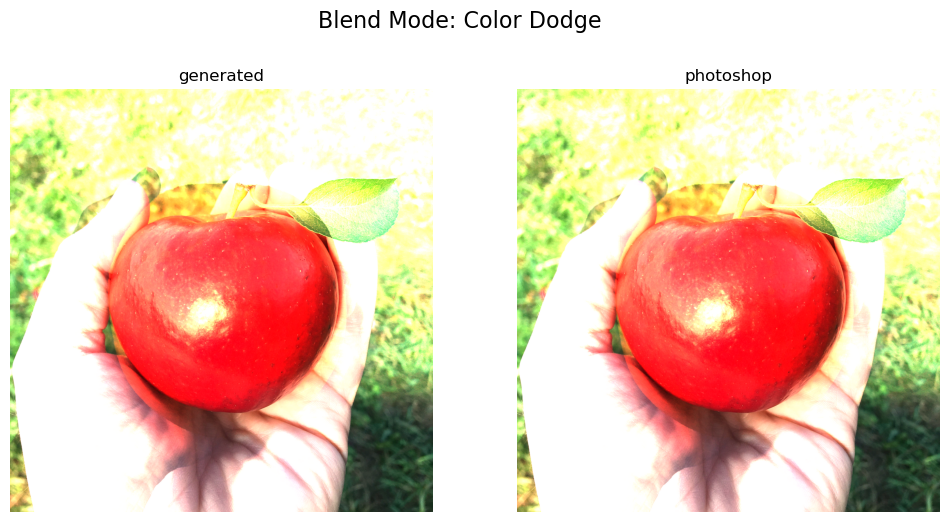

In [10]:
def color_dodge(image1, image2):
    return np.clip(image1 / (1 - image2 + epsilon), 0, 1)  

test_blend_mode('color_dodge', color_dodge)

### Linear Dodge (Add)
Looks at the color information in each channel and brightens the base color to reflect the blend color by increasing the brightness. Blending with black produces no change. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

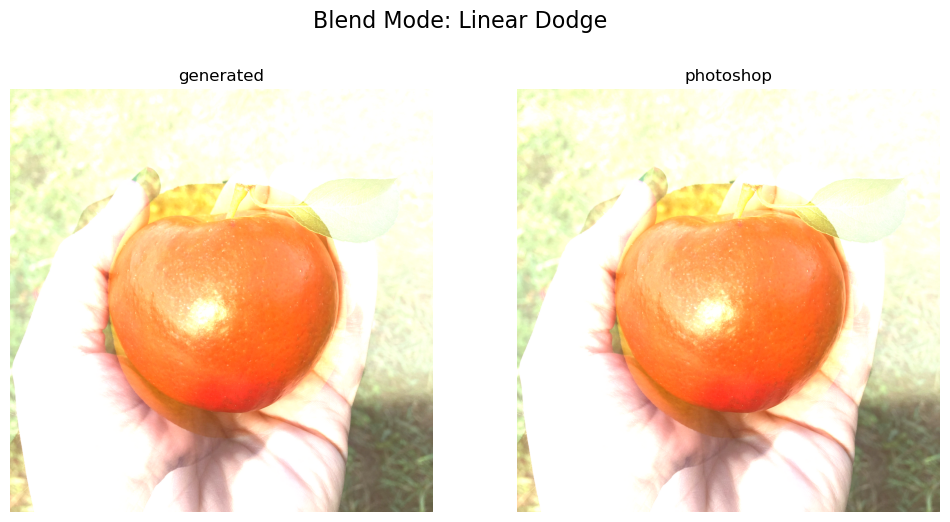

In [11]:
def linear_dodge(image1, image2):
    return np.clip(image1 + image2, 0, 1)   

test_blend_mode('linear_dodge', linear_dodge)

### Lighter Color
Uses apparent brightness to compare base and blend images and choose the lighter color between the two at each pixel location

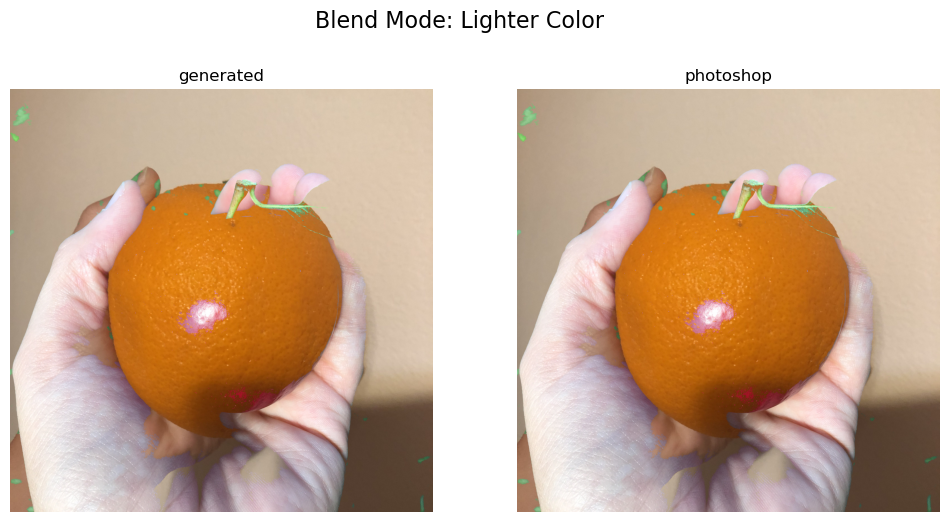

In [12]:
def lighter_color(image1, image2):
    # Apply the color brightness formula
    brightness_image1 = calculate_color_brightness(image1)
    brightness_image2 = calculate_color_brightness(image2)
    
    # Find the maximum sum between the two images
    min_sum = np.maximum(brightness_image1, brightness_image2)
    
    # Use np.where to select colors based on the maximum sum
    mask = (brightness_image1 == min_sum)
    return np.where(mask[:, :, None], image1, image2)  

test_blend_mode('lighter_color', lighter_color)

### Overlay
Multiplies or screens the colors, depending on the base color. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

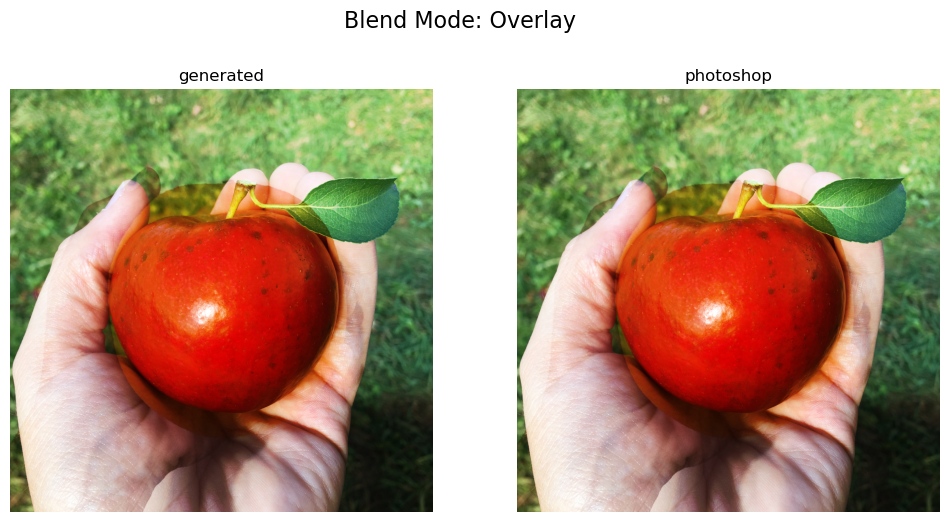

In [13]:
def overlay(image1, image2):
    return np.where(
        image1 < 0.5,
        2 * image2 * image1,
        1 - 2 * (1 - image2) * (1 - image1)
    )  

test_blend_mode('overlay', overlay)

### Soft Light
Darkens or lightens the colors, depending on the blend color. If the blend color is lighter than 50% gray, the image is lightened as if it were dodged. If the blend color is darker than 50% gray, the image is darkened as if it were burned in. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

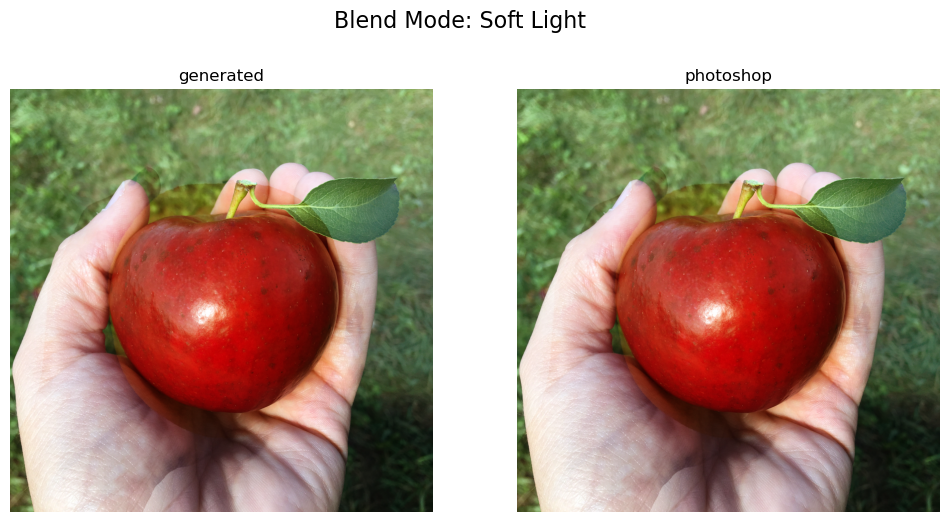

In [14]:
def soft_light(image1, image2):
    return np.where(
        image2 <= 0.5,
        image1 * (1 - (1 - 2 * image2) * (1 - image1)),
        image1 + (2 * image2 - 1) * (np.sqrt(image1) - image1)
    )

test_blend_mode('soft_light', soft_light)

### Hard Light
Multiplies or screens the colors, depending on the blend color. If the blend color (light source) is lighter than 50% gray, the image is lightened, as if it were screened. If the blend color is darker than 50% gray, the image is darkened, as if it were multiplied. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

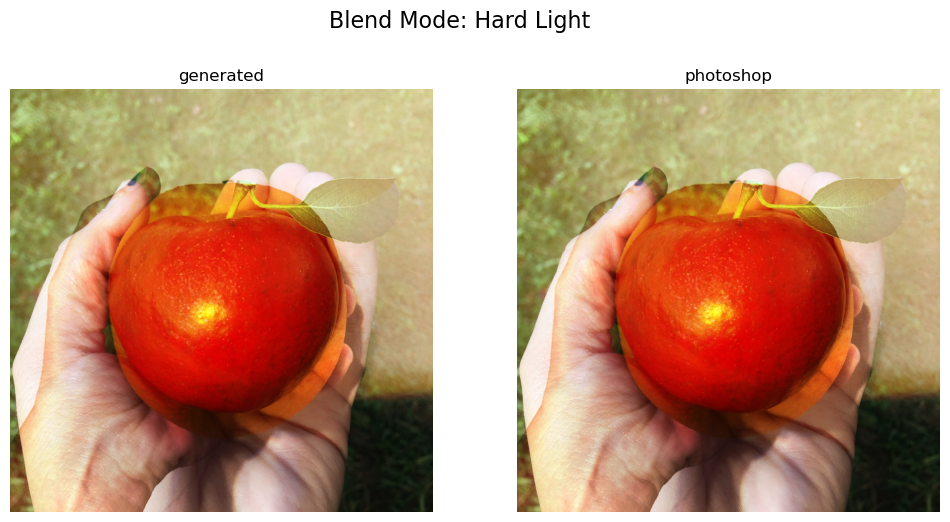

In [15]:
def hard_light(image1, image2):
    return np.where(
        image2 < 0.5,
        2 * image2 * image1,
        1 - 2 * (1 - image2) * (1 - image1)
    )  

test_blend_mode('hard_light', hard_light)

### Vivid Light
Burns or dodges the colors by increasing or decreasing the contrast, depending on the blend color. If the blend color (light source) is lighter than 50% gray, the image is lightened by decreasing the contrast. If the blend color is darker than 50% gray, the image is darkened by increasing the contrast. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

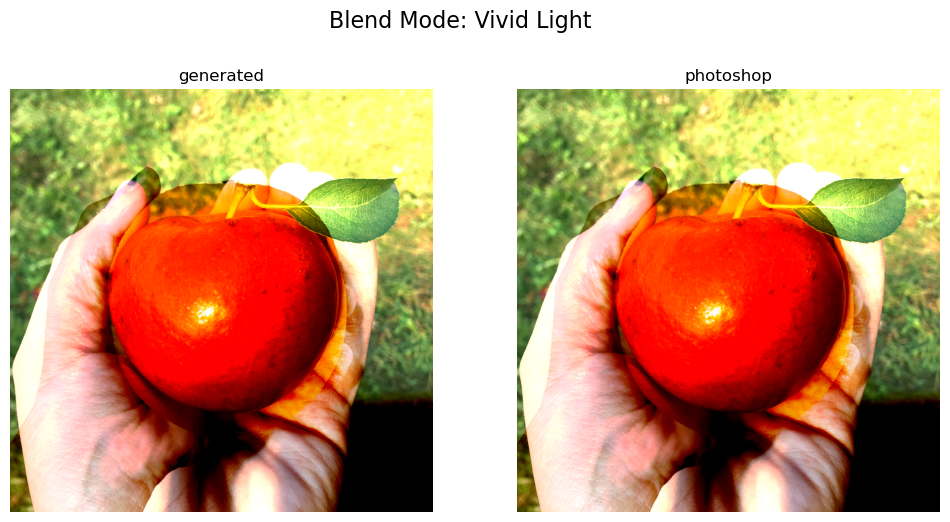

In [16]:
def vivid_light(image1, image2):
    return np.clip(np.where(
        image2 <= 0.5,
        1 - (1 - image1) / (2 * image2 + 1e-10),
        image1 / (2 * (1 - image2) + 1e-10)
    ),0,1)

test_blend_mode('vivid_light', vivid_light)

### Linear Light
Burns or dodges the colors by decreasing or increasing the brightness, depending on the blend color. If the blend color (light source) is lighter than 50% gray, the image is lightened by increasing the brightness. If the blend color is darker than 50% gray, the image is darkened by decreasing the brightness. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

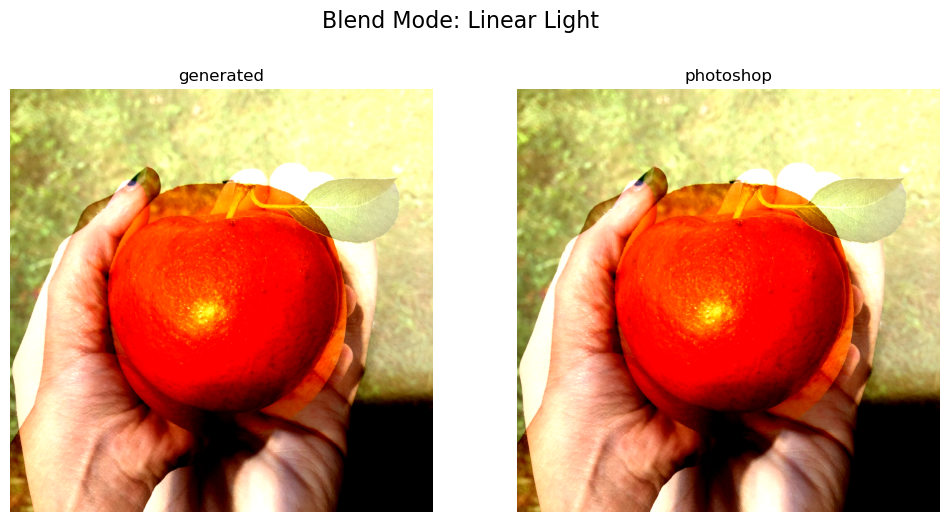

In [17]:
def linear_light(image1, image2):
    return np.clip(image1 + 2 * image2 - 1, 0, 1)

test_blend_mode('linear_light', linear_light)

### Pin Light
Replaces the colors, depending on the blend color. If the blend color (light source) is lighter than 50% gray, pixels darker than the blend color are replaced, and pixels lighter than the blend color do not change. If the blend color is darker than 50% gray, pixels lighter than the blend color are replaced, and pixels darker than the blend color do not change. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

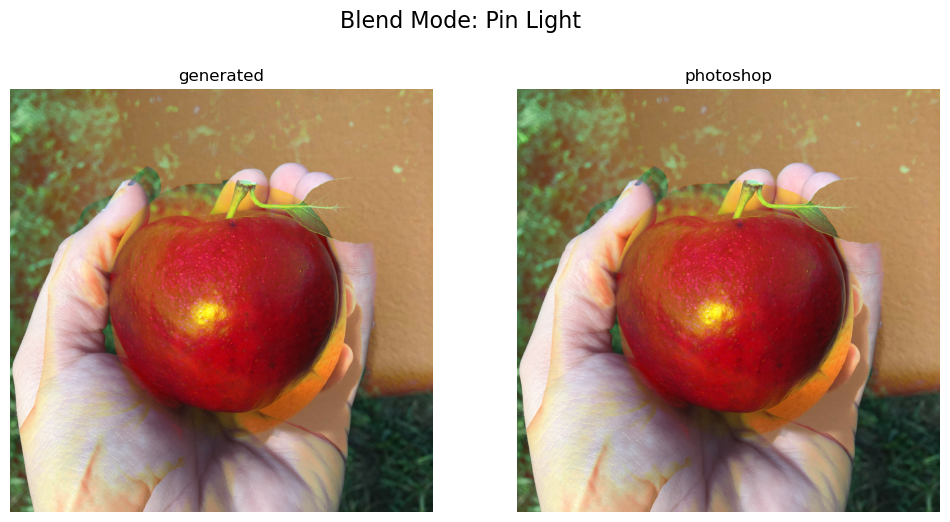

In [18]:
def pin_light(image1, image2):
    return np.clip(np.where(
        image2 <= 0.5,
        np.minimum(image1, 2 * image2),
        np.maximum(image1, 2 * (image2 - 0.5))
    ), 0, 1)

test_blend_mode('pin_light', pin_light)

### Hard Mix
Adds the red, green and blue channel values of the blend color to the RGB values of the base color. If the resulting sum for a channel is 255 or greater, it receives a value of 255; if less than 255, a value of 0. Therefore, all blended pixels have red, green, and blue channel values of either 0 or 255.  [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

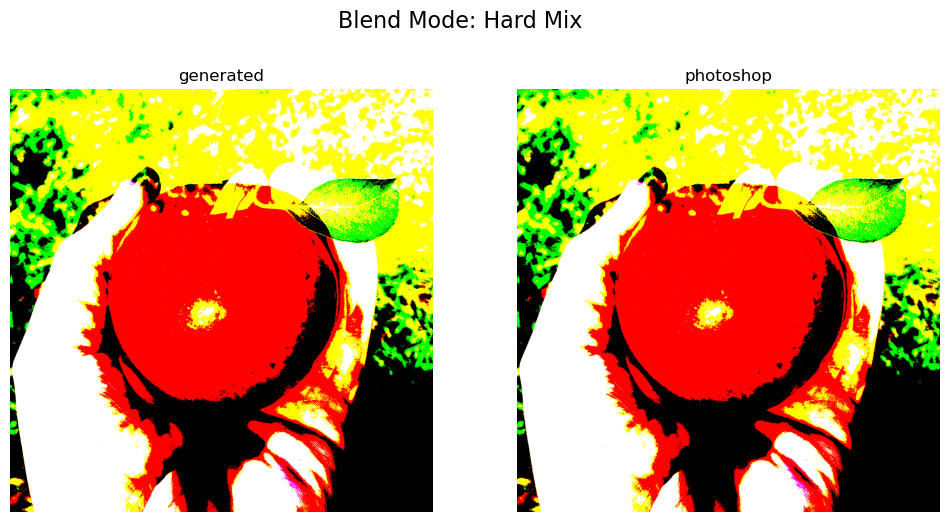

In [19]:
def hard_mix(image1, image2):
    return np.where(image1 + image2 >= 1, 1, 0) 

test_blend_mode('hard_mix', hard_mix)

### Difference
Looks at the color information in each channel and subtracts either the blend color from the base color or the base color from the blend color, depending on which has the greater brightness value. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

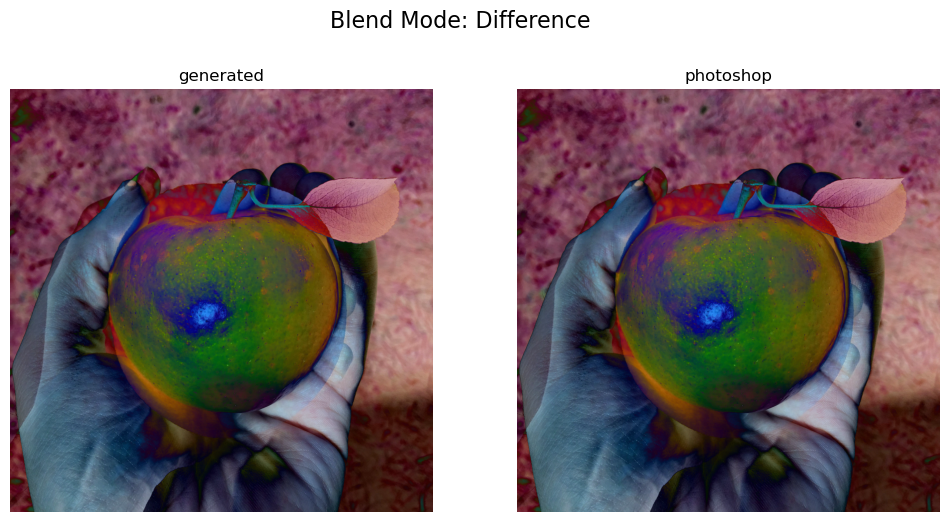

In [20]:
def difference(image1, image2):
    return np.abs(image1[:,:,0:3] - image2[:,:,0:3])

test_blend_mode('difference', difference)

### Exclusion
Creates an effect similar to but lower in contrast than the Difference mode.  [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

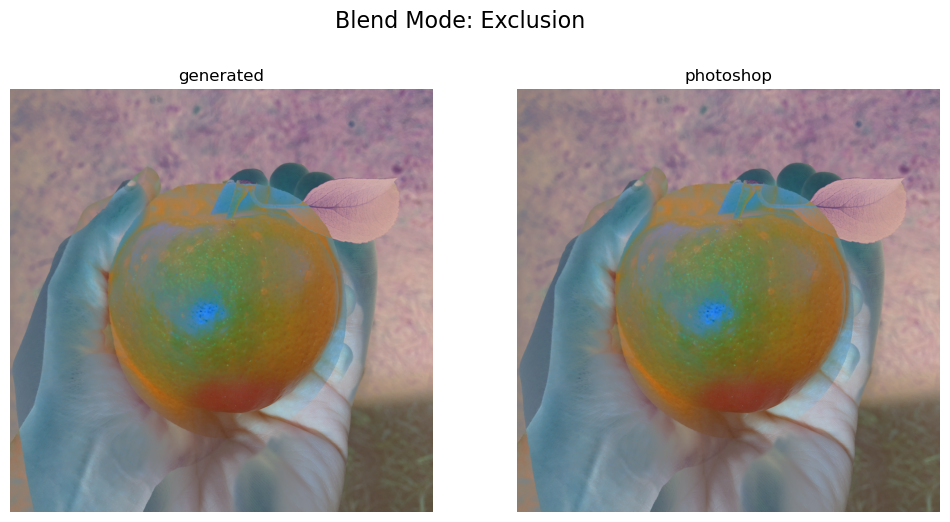

In [21]:
def exclusion(image1, image2):
    image1 = image1[:,:,0:3]
    image2 = image2[:,:,0:3]
    return np.clip(np.abs(image1 + image2 - 2 * image1 * image2), 0, 1)

test_blend_mode('exclusion', exclusion)

### Subtract

Looks at the color information in each channel and subtracts the blend color from the base color. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

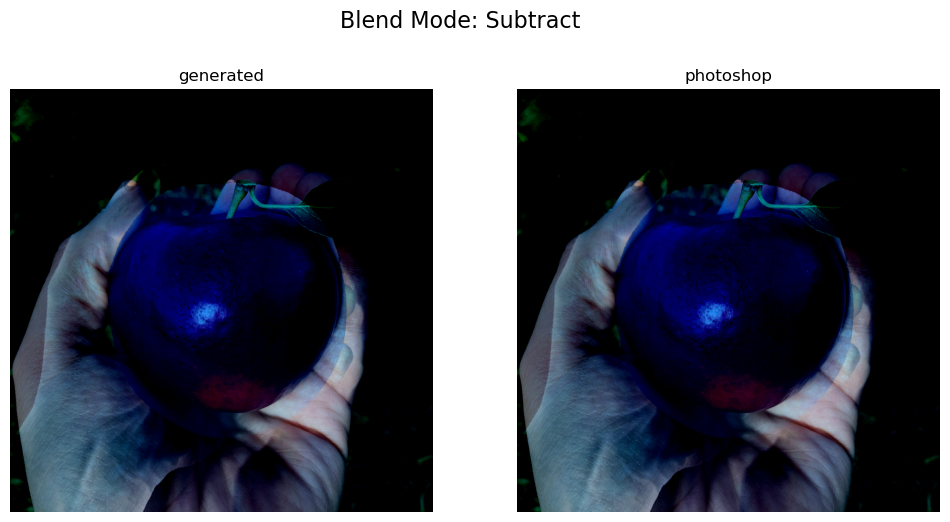

In [22]:
def subtract(image1, image2):
    return np.clip(image1[:,:,0:3] - image2[:,:,0:3], 0, 1)

test_blend_mode('subtract', subtract)

### Divide

Looks at the color information in each channel and divides the blend color from the base color. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

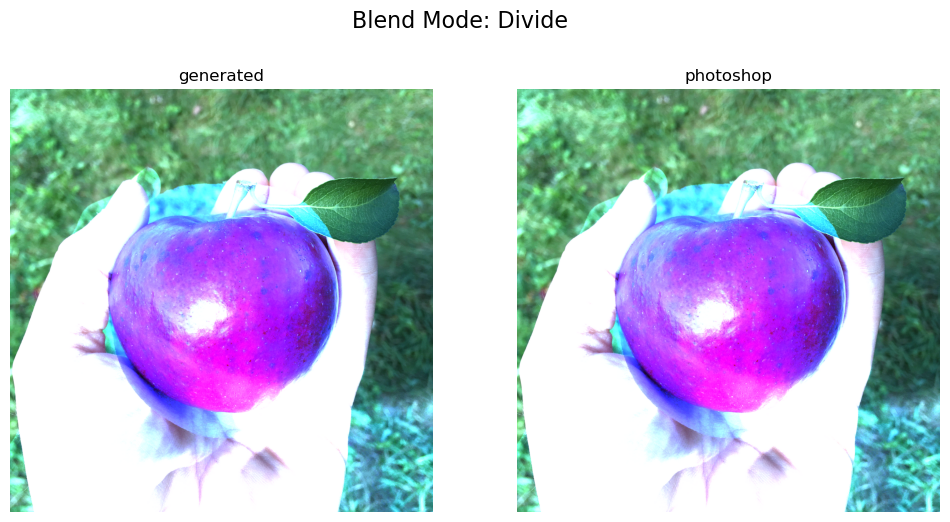

In [23]:
def divide(image1, image2):
    return np.clip(np.divide(image1, np.clip(image2, epsilon, 1)), 0, 1)

test_blend_mode('divide', divide)

In [24]:
# Additional Functions needed for Hue, Saturation, Color, and Luminosity Blend Modes

def rgb_to_hcl(image):
    """
    Convert an RGB image to HCL (Hue, Chroma, Luma)

    Parameters:
    image (numpy.ndarray): The RGB image with values in the range [0, 1].

    Returns:
    numpy.ndarray: The HCL image with values in the range [0, 1].
    """
    # Split the image into R, G, and B channels
    r, g, b = image[:, :, 0], image[:, :, 1], image[:, :, 2]

    # Calculate max and min values for each pixel
    maxc = np.maximum(np.maximum(r, g), b)
    minc = np.minimum(np.minimum(r, g), b)
    
    # Calculate chroma
    c = maxc - minc
    
    # Calculate hue (h)
    h = np.zeros_like(maxc)
    mask = c != 0
    h[mask & (maxc == r)] = (g[mask & (maxc == r)] - b[mask & (maxc == r)]) / c[mask & (maxc == r)]
    h[mask & (maxc == g)] = 2.0 + (b[mask & (maxc == g)] - r[mask & (maxc == g)]) / c[mask & (maxc == g)]
    h[mask & (maxc == b)] = 4.0 + (r[mask & (maxc == b)] - g[mask & (maxc == b)]) / c[mask & (maxc == b)]

    # Normalize hue to [0, 1]
    h = (h / 6.0) % 1.0
    
    # Calculate luma (l)
    l = calculate_color_brightness(image)
    
    # Stack H, S, and L channels into an HSL image
    hcl_image = np.stack([h, c, l], axis=-1)

    return hcl_image

import numpy as np

def hcl_to_rgb(hcl_image):
    """
    Convert an HCL image (Hue, Chroma, Luma) to RGB.
    Hue is scaled to [0, 1].
    
    Parameters:
    hcl_image (numpy.ndarray): The HCL image with values in the range [0, 1].
    
    Returns:
    numpy.ndarray: The RGB image with values in the range [0, 1].
    """
    h, c, l = hcl_image[:, :, 0], hcl_image[:, :, 1], hcl_image[:, :, 2]
    
    # Hue scaled to [0, 6] to handle sectors
    h_prime = h * 6
    
    # Intermediate value X, depending on which sector of H' we're in
    x = c * (1 - np.abs(h_prime % 2 - 1))

    # Initialize RGB values
    r1 = np.zeros_like(h)
    g1 = np.zeros_like(h)
    b1 = np.zeros_like(h)

    # Assign RGB1 based on the sector of the hue
    mask = (0 <= h_prime) & (h_prime < 1)
    r1[mask], g1[mask], b1[mask] = c[mask], x[mask], 0

    mask = (1 <= h_prime) & (h_prime < 2)
    r1[mask], g1[mask], b1[mask] = x[mask], c[mask], 0

    mask = (2 <= h_prime) & (h_prime < 3)
    r1[mask], g1[mask], b1[mask] = 0, c[mask], x[mask]

    mask = (3 <= h_prime) & (h_prime < 4)
    r1[mask], g1[mask], b1[mask] = 0, x[mask], c[mask]

    mask = (4 <= h_prime) & (h_prime < 5)
    r1[mask], g1[mask], b1[mask] = x[mask], 0, c[mask]

    mask = (5 <= h_prime) & (h_prime < 6)
    r1[mask], g1[mask], b1[mask] = c[mask], 0, x[mask]

    # Calculate adjustment value to match luma (Y601)
    m = (l - (0.299 * r1 + 0.587 * g1 + 0.114 * b1))
    
    #calculate scale factor
    ms = np.where(l>0,(0.299 * r1 + 0.587 * g1 + 0.114 * b1)/l,epsilon)

    #calculate add factor
    ma = np.where(m+x>1, 2*m + c + x - 2, (m+c-1)/2)
    
    # Calculate Final RGB Values
    # case 1 (too bright): m + c > 1: add remainder to other channels
    # case 2 (normal): 0 <= m <= 1 - c : add m to all channels
    # case 3 (too dark): m < 0 : divide rgb1 by scale factor brightness/luma
    r = np.clip(np.where(m+c>1, r1 + m + ma, np.where(m<0, r1/(ms+epsilon), r1 + m)),0,1)
    g = np.clip(np.where(m+c>1, g1 + m + ma, np.where(m<0, g1/(ms+epsilon), g1 + m)),0,1)
    b = np.clip(np.where(m+c>1, b1 + m + ma, np.where(m<0, b1/(ms+epsilon), b1 + m)),0,1)
    
    # Stack R, G, B channels into an RGB image
    rgb_image = np.stack([r, g, b], axis=-1)

    return rgb_image

### Hue
Creates a result color with the luminance and saturation of the base color and the hue of the blend color. [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

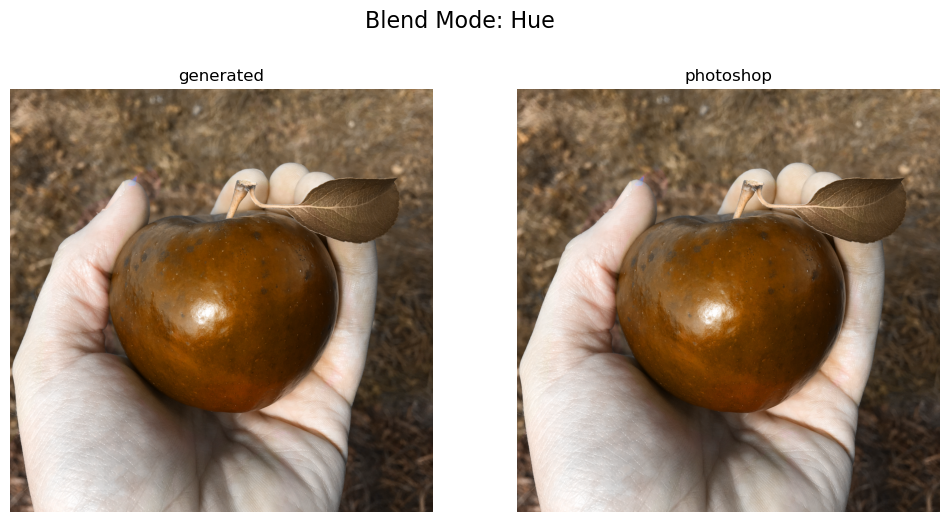

In [25]:
def hue(image1, image2):
    # Convert both images from RGB to HCL
    hcl1 = rgb_to_hcl(image1)
    hcl2 = rgb_to_hcl(image2)
    
    # Create the resulting HSL image by taking the hue from image2 and the saturation and lightness from image1
    result_hcl = np.stack([hcl2[:, :, 0], hcl1[:, :, 1], hcl1[:, :, 2]], axis=-1)
    
    # Convert the result back to RGB
    return hcl_to_rgb(result_hcl)

test_blend_mode('hue', hue)

### Saturation
Creates a result color with the luminance and hue of the base color and the saturation of the blend color.  [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

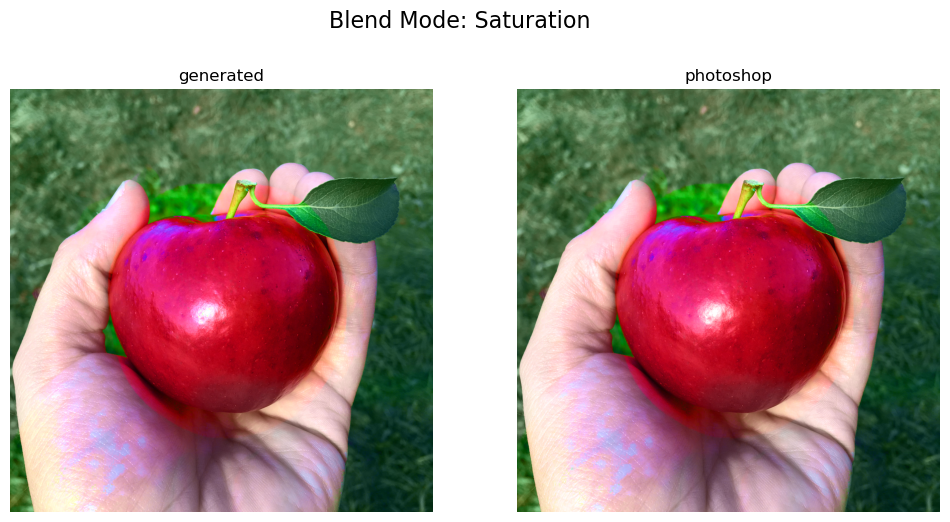

In [26]:
import matplotlib
def saturation(image1, image2):
    # Convert both images from RGB to HCL
    hcl1 = rgb_to_hcl(image1)
    hcl2 = rgb_to_hcl(image2)
    
    # Combine the hue and lightness of the base image (image1) with the saturation of the blend image (image2)
    result_hcl = np.stack([hcl1[:, :, 0], hcl2[:, :, 1], hcl1[:, :, 2]], axis=-1)
    
    # Convert the result back to RGB
    return hcl_to_rgb(result_hcl)

test_blend_mode('saturation', saturation)

### Color
Creates a result color with the luminance of the base color and the hue and saturation of the blend color.  [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

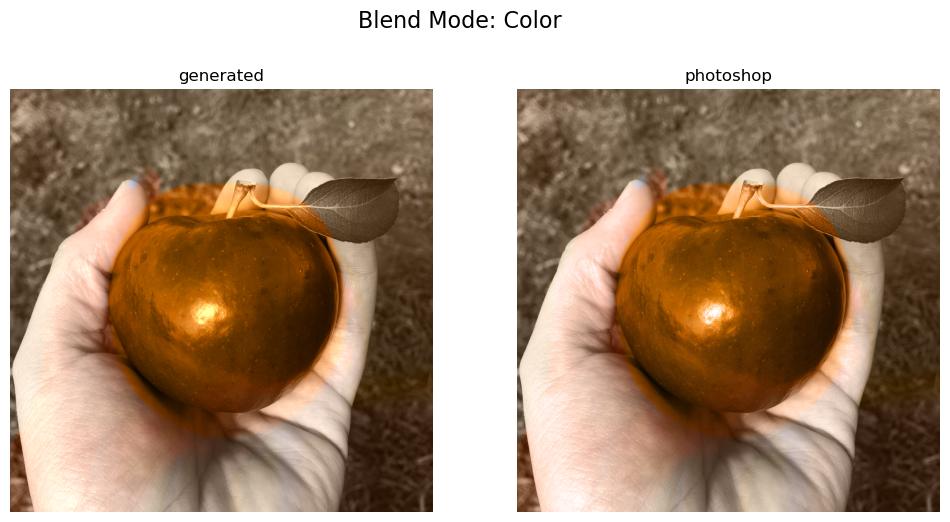

In [27]:
def color(image1, image2):
    # Convert both images from RGB to HCL
    hcl1 = rgb_to_hcl(image1)
    hcl2 = rgb_to_hcl(image2)
    
    # Create the resulting HCL image by taking the hue and saturation from image2 and the lightness from image1
    result_hcl = np.stack([hcl2[:, :, 0], hcl2[:, :, 1], hcl1[:, :, 2]], axis=-1)
    
    # Convert the result back to RGB
    return hcl_to_rgb(result_hcl)

test_blend_mode('color', color)

### Luminosity
Creates a result color with the hue and saturation of the base color and the luminance of the blend color.  [[source](https://helpx.adobe.com/photoshop/using/blending-modes.html)]

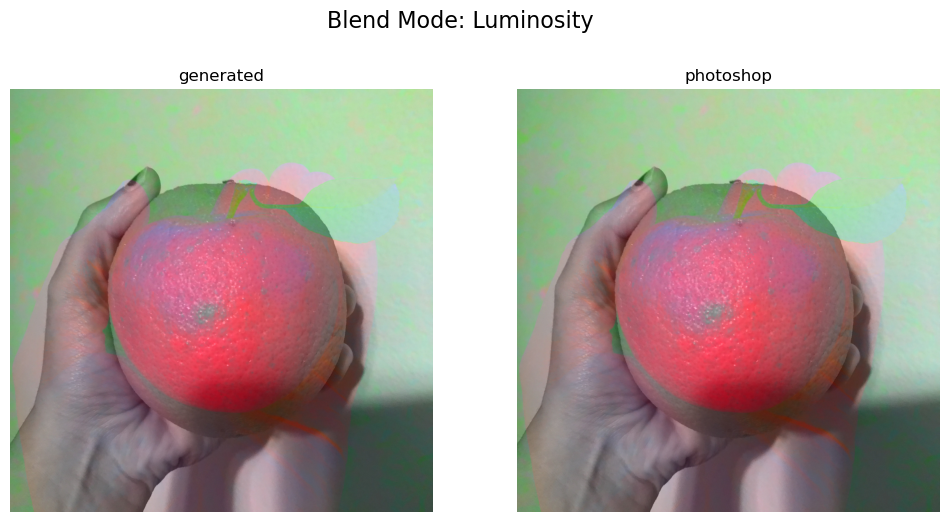

In [28]:
def luminosity(image1, image2):
    # Convert both images from RGB to HCL
    hcl1 = rgb_to_hcl(image1)
    hcl2 = rgb_to_hcl(image2)
    
    # Create the resulting HCL image by taking the hue and saturation from image1 and the lightness from image2
    result_hcl = np.stack([hcl1[:, :, 0], hcl1[:, :, 1], hcl2[:, :, 2]], axis=-1)
    
    # Convert the result back to RGB
    return hcl_to_rgb(result_hcl)

test_blend_mode('luminosity', luminosity)